# Module 1: Classical Image processing

## Part 1 : Color classification

They have captured Butterflies of 3 different colors. Can you classify them by color? there should be 4 pictures of each type.

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
import cv2
from skimage.color import rgb2lab
from scipy.ndimage import uniform_filter,label, maximum_filter
from skimage import io, color
from mpl_toolkits.mplot3d import Axes3D  
import os
from scipy import ndimage
from skimage.segmentation import watershed
from skimage.morphology import disk, erosion, dilation
from skimage.filters import gaussian, sobel
from scipy.spatial.distance import pdist, squareform
import matplotlib.patches as mpatches



In [2]:
#Load all the images and their names
files = os.listdir("./data")
images = []
image_names = []
for file in files:
    
    full_path = os.path.join("./data",file)
    image = cv2.imread(full_path)
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(rgb_image)
    image_names.append(file)

Visualising what the images look like: 

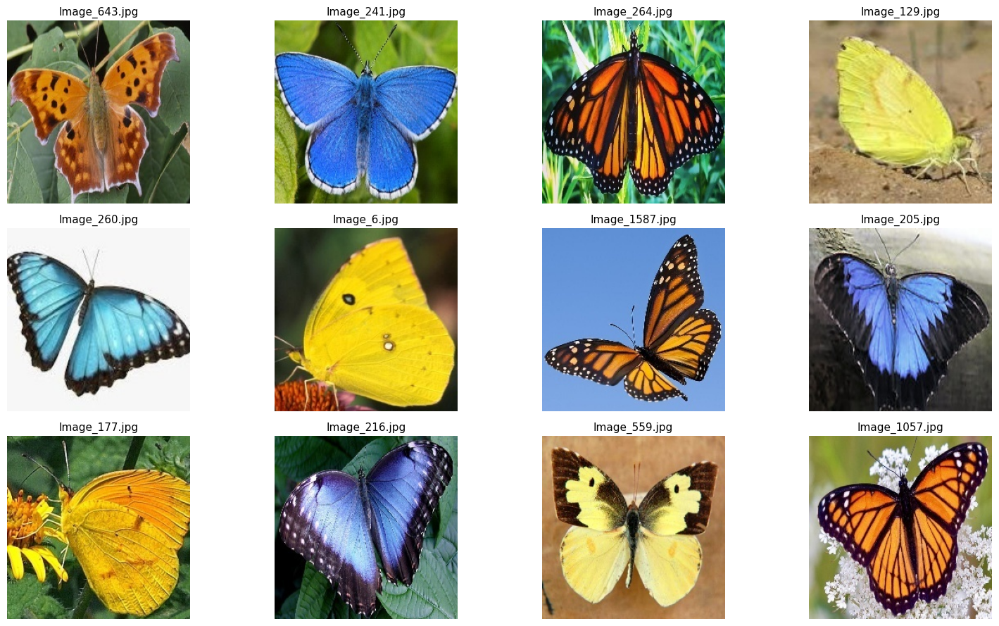

In [3]:
# Plotting
n = len(images)
cols = 4
rows = (n + cols - 1) // cols

plt.figure(figsize=(4 * cols, 3 * rows))
for i, img in enumerate(images):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(image_names[i], fontsize=11)
    plt.axis('off')

plt.tight_layout()
plt.show()

I want to crop the images to remove the effect of background color on the butterfly classification.

In [4]:
# Function to crop the center of the image
def crop_center_rect(image, crop_height=150, crop_width=150):
    h, w, _ = image.shape
    crop_h = min(h, crop_height)
    crop_w = min(w, crop_width)
    start_x = w // 2 - crop_w // 2
    start_y = h // 2 - crop_h // 2
    return image[start_y:start_y + crop_h, start_x:start_x + crop_w]



In [5]:
# use the function to crop
rect_cropped_images = [crop_center_rect(img, crop_height=100, crop_width=150) for img in images]

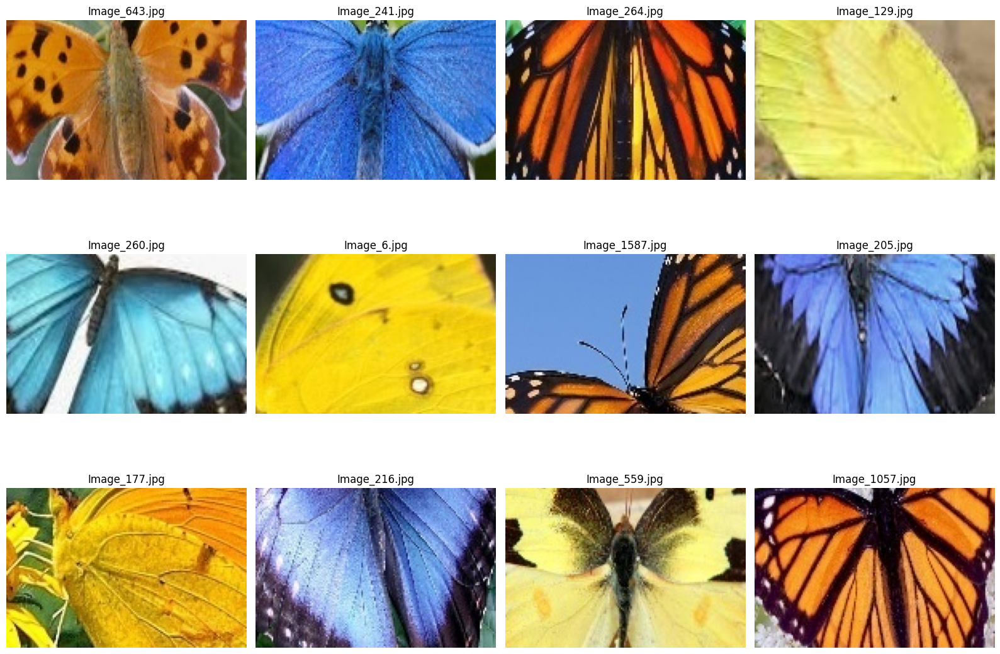

In [6]:
# Plot the cropped images
n = len(rect_cropped_images)
cols = 4
rows = (n + cols - 1) // cols

plt.figure(figsize=(4 * cols, 4 * rows))
for i, img in enumerate(rect_cropped_images):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(image_names[i])
    plt.axis('off')
plt.tight_layout()
plt.show()




In [7]:
# Here, I am returning a mask where i am getting rid of areas iwth low variation
def mask_low_variation(image, window_size=5, std_thresh=0.02):
    """Returns mask where local std of V channel > threshold (True = keep)"""
    hsv = color.rgb2hsv(image)
    v = hsv[..., 2]
    mean = uniform_filter(v, size=window_size)
    mean_sq = uniform_filter(v**2, size=window_size)
    local_std = np.sqrt(mean_sq - mean**2)
    return local_std > std_thresh

def get_median_hsv(image, return_mask=False):
    hsv = color.rgb2hsv(image)
    h = hsv[..., 0] * 360
    s = hsv[..., 1]
    v = hsv[..., 2]

    base_mask = (s > 0.2) & (v > 0.2)
    var_mask = mask_low_variation(image, window_size=5, std_thresh=0.02)
    final_mask = base_mask & var_mask

    h_valid = h[final_mask]
    s_valid = s[final_mask]
    v_valid = v[final_mask]

    if return_mask:
        return var_mask  

    if len(h_valid) == 0:
        return (0, 0, 0)
    return (np.median(h_valid), np.median(s_valid), np.median(v_valid))


#Finally, I am computing a distance matrix of all the pictures for their median values. The distance equation puts more emphasis on brightness (because yellow is brighter than orange)
def hue_value_distance(hsv1, hsv2):
    h1, _, v1 = hsv1
    h2, _, v2 = hsv2
    hue_diff = min(abs(h1 - h2), 360 - abs(h1 - h2))
    val_diff = v1 - v2
    return np.sqrt(hue_diff**2 + (150 * val_diff)**2)



I want to visualise what the low variation mask actually looks like:

/var/folders/9l/2p8y7fsj3vx7zmgnjbtt1jb40000gn/T/ipykernel_9789/3759412836.py:8: RuntimeWarning: invalid value encountered in sqrt
  local_std = np.sqrt(mean_sq - mean**2)


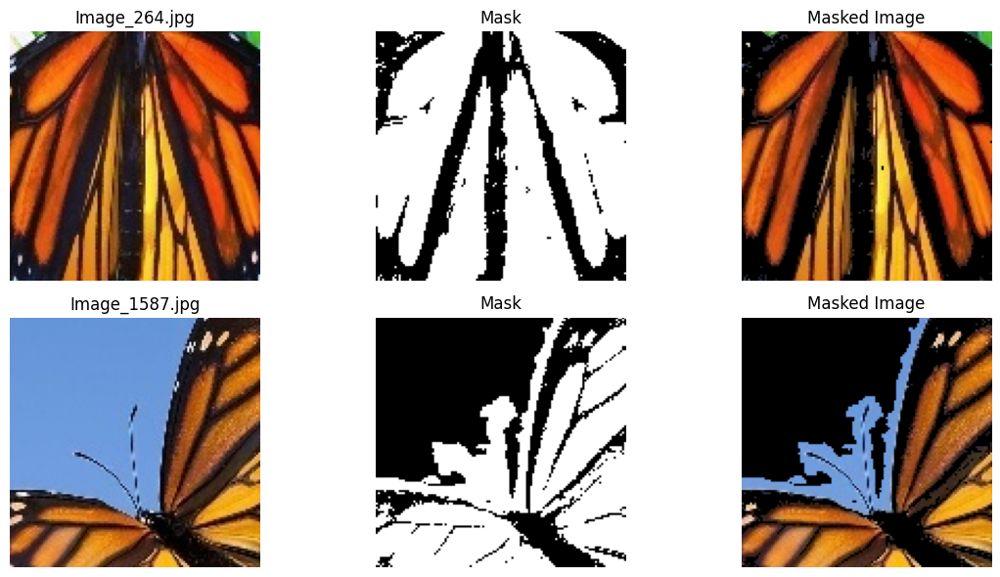

In [8]:
# For the report, I want to see what the mask looks like when applied, so I have made a function to apply the mask and return the masked image
def apply_mask(image, mask):
    masked_image = np.zeros_like(image)
    for c in range(3):
        masked_image[..., c] = image[..., c] * mask
    return masked_image

selected_indices = [i for i, name in enumerate(image_names) if '264' in name or '1587' in name]

selected_images = [images[i] for i in selected_indices]
selected_names = [image_names[i] for i in selected_indices]

cols = 3
rows = len(selected_images)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3))
if rows == 1:
    axes = np.expand_dims(axes, axis=0)

for i, img in enumerate(selected_images):
    name = selected_names[i]

    cropped = crop_center_rect(img, crop_height=120, crop_width=120)
    hsv = color.rgb2hsv(cropped)
    s = hsv[..., 1]
    v = hsv[..., 2]

    base_mask = (s > 0.2) & (v > 0.2)
    var_mask = mask_low_variation(cropped, window_size=5, std_thresh=0.01)
    final_mask = base_mask & var_mask
    masked_img = apply_mask(cropped, final_mask)

    axes[i, 0].imshow(cropped)
    axes[i, 0].set_title(name)
    axes[i, 1].imshow(final_mask, cmap='gray')
    axes[i, 1].set_title("Mask")
    axes[i, 2].imshow(masked_img)
    axes[i, 2].set_title("Masked Image")

    for ax in axes[i]:
        ax.axis('off')

plt.tight_layout()
plt.show()



Then I compute the median hsv values.

In [9]:
median_hsvs = [get_median_hsv(img) for img in rect_cropped_images]

/var/folders/9l/2p8y7fsj3vx7zmgnjbtt1jb40000gn/T/ipykernel_9789/3759412836.py:8: RuntimeWarning: invalid value encountered in sqrt
  local_std = np.sqrt(mean_sq - mean**2)


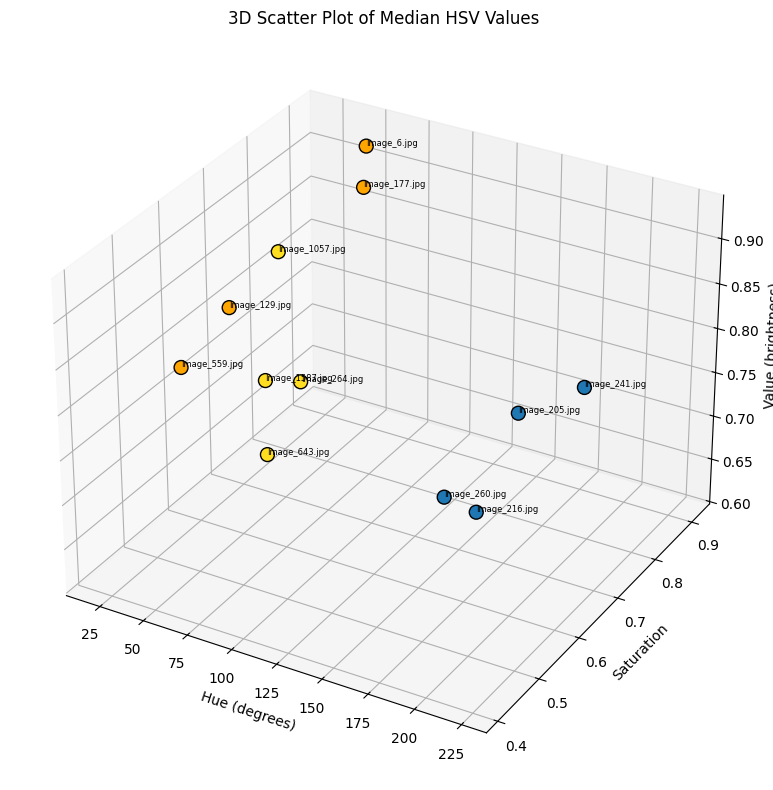

In [10]:
# visualising the classification 

labels = ['orange', 'blue', 'orange', 'yellow', 'blue', 'yellow',
          'orange', 'blue', 'yellow', 'blue', 'yellow', 'orange']

#label names to RGB color
label_colors = {
    'blue': '#1f77b4',
    'yellow': '#FFA500',
    'orange': '#FFDE21'
}

hues = [hsv[0] for hsv in median_hsvs]
sats = [hsv[1] for hsv in median_hsvs]
vals = [hsv[2] for hsv in median_hsvs]
colors = [label_colors[label] for label in labels]

#plotting
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(hues, sats, vals, c=colors, s=100, edgecolor='black',alpha=1.0)
ax.set_xlabel("Hue (degrees)")
ax.set_ylabel("Saturation")
ax.set_zlabel("Value (brightness)")
ax.set_title("3D Scatter Plot of Median HSV Values")

for i, img_id in enumerate(image_names):
    ax.text(hues[i], sats[i], vals[i], str(img_id), size=6)

plt.tight_layout()
plt.show()



In [11]:
#calculating the distances 
n = len(median_hsvs)

dist_matrix = np.zeros((n, n))
for i in range(n):
    for j in range(n):
        dist_matrix[i, j] = hue_value_distance(median_hsvs[i], median_hsvs[j])


In [12]:
#grouping them with a threshold of my choosing ( i chose 35 )
def group_by_distance_threshold(dist_matrix, threshold):
    n = dist_matrix.shape[0]
    groups = []
    assigned = [False] * n

    for i in range(n):
        if assigned[i]:
            continue
        group = [i]
        assigned[i] = True
        for j in range(i + 1, n):
            if not assigned[j] and dist_matrix[i, j] < threshold:
                group.append(j)
                assigned[j] = True
        groups.append(group)
    return groups


In [13]:
groups = group_by_distance_threshold(dist_matrix, threshold=35)

group_names = ['orange', 'blue', 'yellow']

color_dict = {name: [] for name in group_names}

for group_idx, group in enumerate(groups):
    if group_idx >= len(group_names):
        break  

    group_name = group_names[group_idx]
    for idx in group:
        color_dict[group_name].append({'image': images[idx], 'name': image_names[idx]})


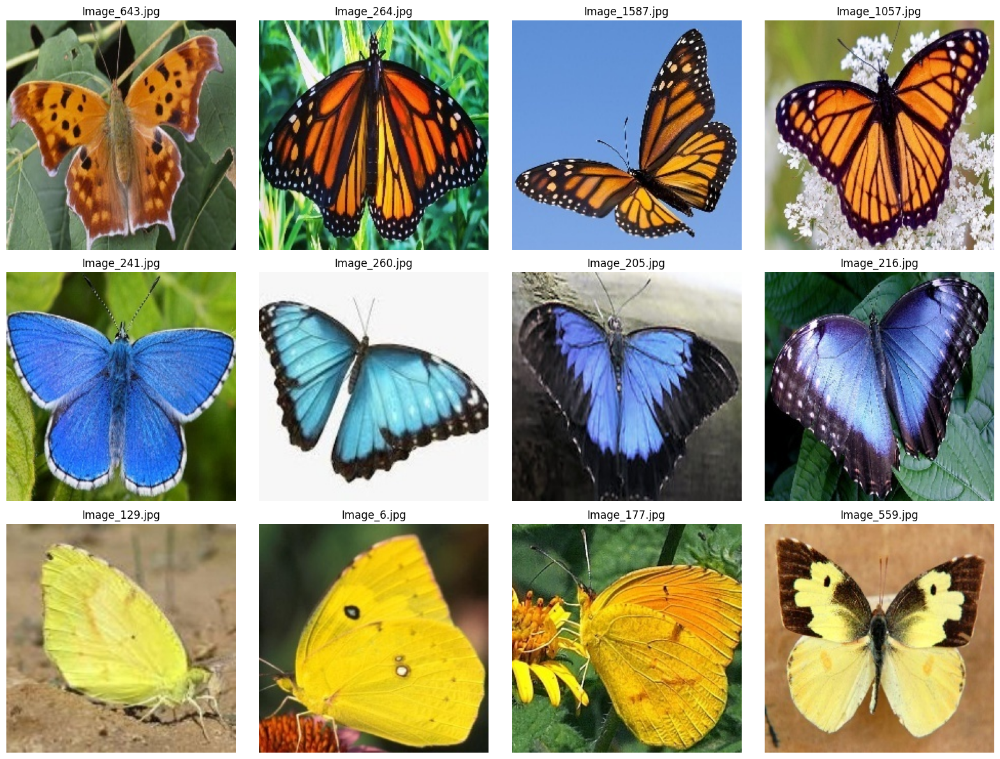

In [14]:
# Plotting teach group to be a row

# groups is a list of lists, like [[0, 2, 5], [1, 3], ...]
rows = len(groups)
cols = max(len(g) for g in groups)

fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))

if rows == 1:
    axes = np.expand_dims(axes, axis=0)
if cols == 1:
    axes = np.expand_dims(axes, axis=1)

for row, group in enumerate(groups):
    for col in range(cols):
        ax = axes[row, col]
        if col < len(group):
            img_index = group[col]
            ax.imshow(images[img_index]) 
            ax.set_title(image_names[img_index])
        ax.axis('off')

plt.tight_layout()
plt.show()


## Part 2: Background removal

They are not interested in the background, so can you please remove it and only keep the butterflies?

To remove the background, I tried a number of different things:

1. Edge detection with Canny

I tried edge detection to find the strong edges around the butterfly for segmentation. To do this, I first turned it into gray scale. I applied a gaussian blur to reduce the noise in the images. I then applied canny edge detection, which is a sobel operator (3x3 kernel convolved with the image to highlight sharp gradient changes). The largest boundary/contour is picked to assume that is the butterfly. a binary mask is created from this contour, a morphological closing is applied to fill holes / gaps. But this gave poor results, maybe because the background are too distracting. 

2. Watershed

3. Grabcut

Grab cut is an iterative graph cutting algorithm. The user first labels what is foreground and what is background using a rectangle. So the algorithm knows whatever is outside this box is a ground truth for background. Gaussian Mixture Model(GMM) is used to model the foreground and background. A graph is built from this pixel distribution. This works really well! Because the background is specific to each image and iteratively learnt. It is not generalised for all the images.

https://docs.opencv.org/4.x/dd/dfc/tutorial_js_grabcut.html#:~:text=It%20cuts%20the%20graph%20into,to%20Sink%20node%20become%20background.


### Watershed

In [25]:


def remove_background_watershed(image, border_width=3, blur_sigma=2.0, 
                              morph_kernel_size=2, closing_kernel_size=3,
                              peak_min_distance=15, peak_threshold=0.2,
                              use_center_seed=True, center_region_size=0.1):
    """
    Remove background using watershed segmentation with edge-based seeds
    
    Parameters:
    - border_width: Width of border used as background seed (smaller = less aggressive)
    - blur_sigma: Gaussian blur strength (higher = smoother, less aggressive)
    - morph_kernel_size: Size of morphological operations (smaller = less aggressive)
    - closing_kernel_size: Size of closing operation (smaller = less aggressive)
    - peak_min_distance: Minimum distance between peaks (for distance transform method)
    - peak_threshold: Relative threshold for peaks (for distance transform method)
    - use_center_seed: If True, use center region as foreground seed; if False, use distance transform
    - center_region_size: Size of center region as fraction of image (0.3 = 30% of image size)
    """

    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    
    blurred = gaussian(gray, sigma=blur_sigma)
    
    gradient = sobel(blurred)
    
    # making markers for watershed
    markers = np.zeros_like(gray, dtype=np.int32)
    
    # Marking the border pixels as background 
    markers[:border_width, :] = 1  # Top
    markers[-border_width:, :] = 1  # Bottom
    markers[:, :border_width] = 1  # Left
    markers[:, -border_width:] = 1  # Right
    
    # Foreground use a center region
    if use_center_seed:

        h, w = gray.shape

        center_h = int(h * center_region_size / 2)
        center_w = int(w * center_region_size / 2)
        
        center_y_start = h // 2 - center_h
        center_y_end = h // 2 + center_h
        center_x_start = w // 2 - center_w
        center_x_end = w // 2 + center_w
        
        markers[center_y_start:center_y_end, center_x_start:center_x_end] = 2
    
    # Apply watershed
    labels = watershed(gradient, markers)
    
    # Create mask where foreground (butterfly) is white, background is black
    mask = (labels == 2).astype(np.uint8) * 255
    
    # Apply morphological closing to fill gaps (smaller kernel = less aggressive)
    kernel = disk(closing_kernel_size)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    
    # Apply the mask to the original image
    if len(image.shape) == 3:
        result = image.copy()
        # Set background pixels to white
        result[mask == 0] = [255, 255, 255]
    else:
        result = image.copy()
        result[mask == 0] = 255
    
    return result, mask, labels

def process_and_display_butterflies(images, image_names, **kwargs):
    """
    Process all butterfly images and display results in a 3x4 grid
    **kwargs: parameters to pass to remove_background_watershed
    """
    fig, axes = plt.subplots(3, 4, figsize=(16, 12))
    fig.suptitle('Butterfly Background Removal using Watershed Segmentation', fontsize=16)
    
    # Flatten axes for easier indexing
    axes_flat = axes.flatten()
    
    for i, (img, name) in enumerate(zip(images, image_names)):
        if i >= 12:  # Only process first 12 images for 3x4 grid
            break
            
        # Process the image with custom parameters
        processed_img, mask, labels = remove_background_watershed(img, **kwargs)
        
        # Display the processed image
        if len(processed_img.shape) == 3:
            axes_flat[i].imshow(processed_img)
        else:
            axes_flat[i].imshow(processed_img, cmap='gray')
            
        axes_flat[i].set_title(f'{name}', fontsize=11)
        axes_flat[i].axis('off')
    
    # Hide any unused subplots
    for i in range(len(images), 12):
        axes_flat[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return fig

def display_plots(color_dict, **kwargs):
    """
    Process and display segmented images and masks using color_dict structure.
    Each row corresponds to a color group (orange, blue, yellow).
    Each subplot is titled with the image name.
    """
    colors = ['orange', 'blue', 'yellow']
    rows = len(colors)
    cols = 4  # Max 4 images per color

    fig1, axes1 = plt.subplots(rows, cols, figsize=(16, 12))
    fig2, axes2 = plt.subplots(rows, cols, figsize=(16, 12))

    fig1.suptitle('Watershed segmentation: Images', fontsize=16)
    fig2.suptitle('Watershed segmentation: Masks', fontsize=16)

    axes1 = axes1 if rows > 1 else [axes1]
    axes2 = axes2 if rows > 1 else [axes2]

    for row, color in enumerate(colors):
        items = color_dict[color][:cols]  # Limit to 4 images per group
        for col, item in enumerate(items):
            img = item['image']
            name = item['name']

            # Running segmentation
            processed_img, mask, _ = remove_background_watershed(img, **kwargs)

            # Plotting
            if len(processed_img.shape) == 3:
                axes1[row][col].imshow(processed_img)
            else:
                axes1[row][col].imshow(processed_img, cmap='gray')
            axes1[row][col].set_title(name, fontsize=10)
            axes1[row][col].axis('off')

            # Plot mask
            axes2[row][col].imshow(mask, cmap='gray')
            axes2[row][col].set_title(name, fontsize=10)
            axes2[row][col].axis('off')

        for col in range(len(items), cols):
            axes1[row][col].axis('off')
            axes2[row][col].axis('off')

    plt.tight_layout()
    plt.show()

    return fig1, fig2


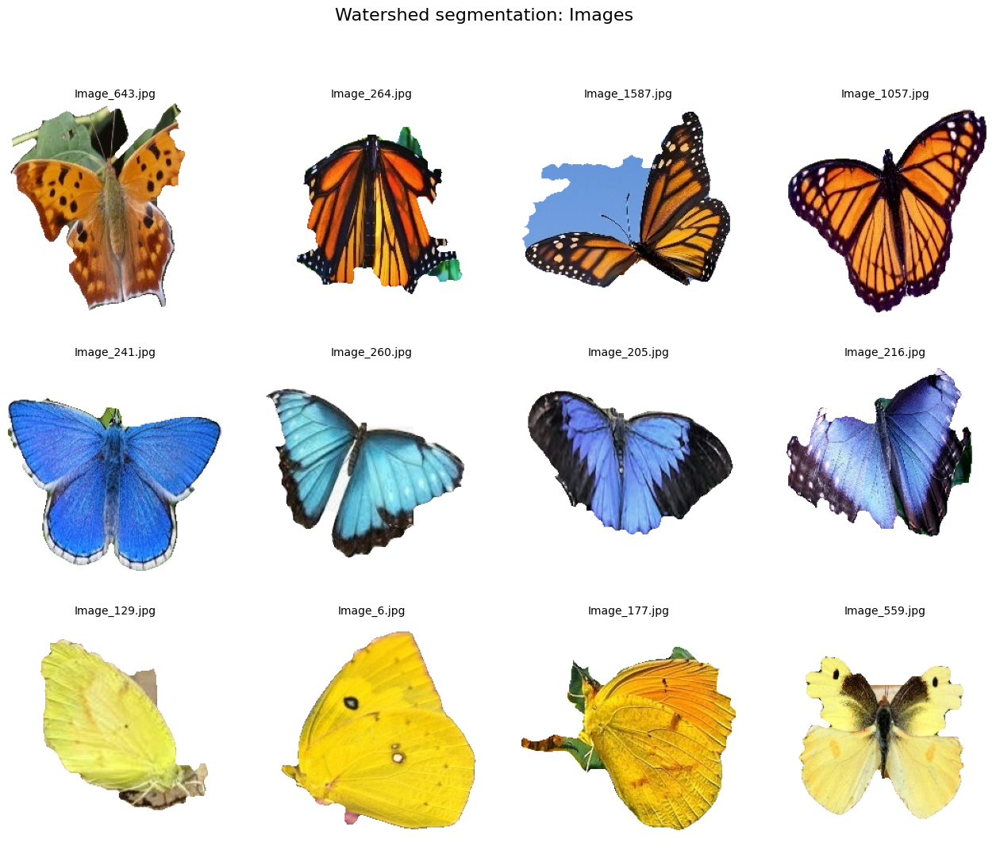

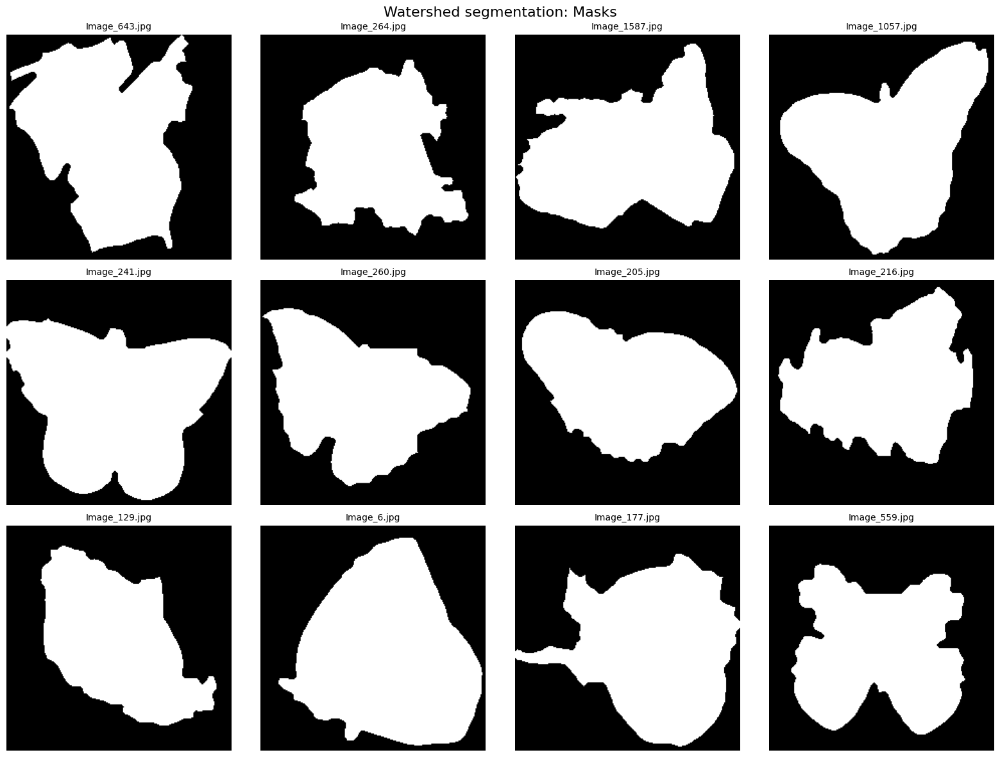

In [26]:
fig1, fig2 = display_plots(
    color_dict,
    border_width=2,
    blur_sigma=3.0,
    morph_kernel_size=1,
    closing_kernel_size=2,
    use_center_seed=True,
    center_region_size=0.4
)


## Now I try grabcut

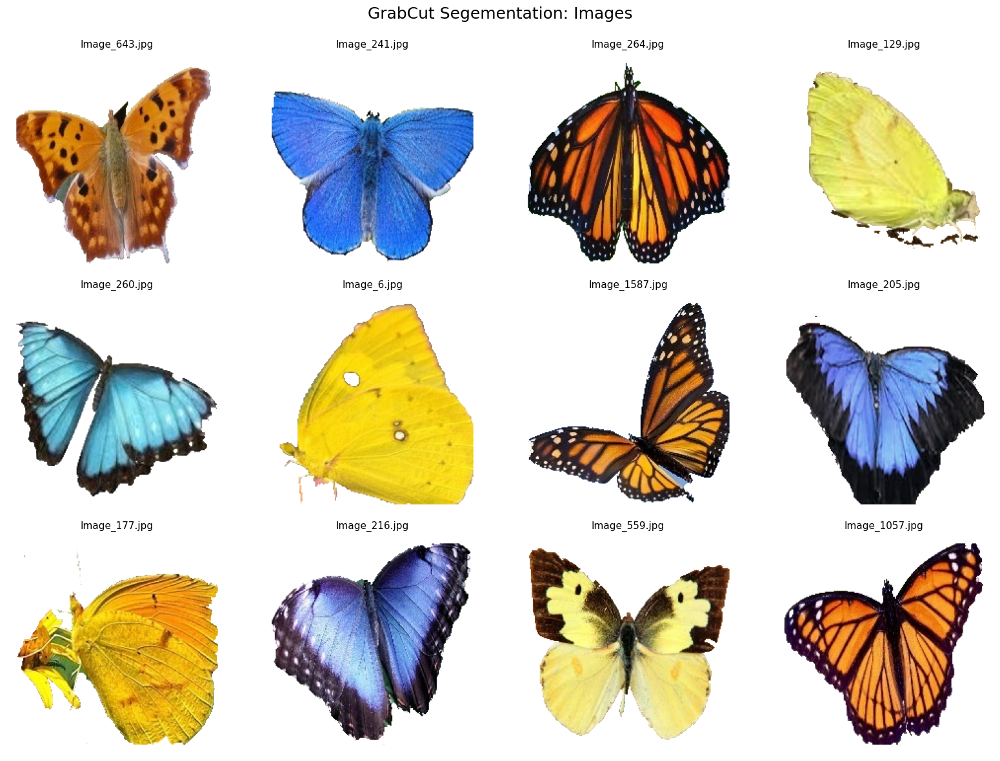

In [17]:
#Grab cut from open CV is used, I made a function so that I can specify the colors, background and foreground
def remove_background_grabcut(img_rgb):
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    h, w = img_bgr.shape[:2]
    rect = (10, 10, w - 20, h - 20)
    mask = np.zeros((h, w), np.uint8)
    bgModel = np.zeros((1, 65), np.float64)
    fgModel = np.zeros((1, 65), np.float64)
    cv2.grabCut(img_bgr, mask, rect, bgModel, fgModel, 5, cv2.GC_INIT_WITH_RECT)
    final_mask = np.where((mask == cv2.GC_FGD) | (mask == cv2.GC_PR_FGD), 1, 0).astype("uint8")
    result = img_bgr * final_mask[:, :, np.newaxis]
    white_bg = np.full_like(img_bgr, 255)
    combined = np.where(final_mask[:, :, np.newaxis] == 0, white_bg, result)
    return cv2.cvtColor(combined, cv2.COLOR_BGR2RGB)

processed_images = []
for img in images:
    img_clean = remove_background_grabcut(img)
    processed_images.append(img_clean)

#i store grabcut results in dictionary

segmented_color_dict = {}
index_lookup = {name: i for i, name in enumerate(image_names)}

for color, entries in color_dict.items():
    segmented_color_dict[color] = []
    for entry in entries:
        name = entry['name']
        idx = index_lookup[name]
        segmented_color_dict[color].append({
            'image': processed_images[idx],
            'name': name
        })


#plotting
n = len(processed_images)
cols = 4
rows = (n + cols - 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
axs = axs.flatten()

for i in range(len(processed_images)):
    axs[i].imshow(processed_images[i])
    axs[i].set_title(image_names[i], fontsize=11)
    axs[i].axis("off")

for j in range(len(processed_images), len(axs)):
    axs[j].axis("off")

plt.tight_layout()
plt.suptitle("GrabCut Segementation: Images", fontsize=18)
plt.subplots_adjust(top=0.92)
plt.show()


## Part 3: Collection display. 

It would be great if we can make an image where all the butterflies of each type are displayed with a single background (your choice). Note that entomologist are very picky, so they want to be able to put as many images of butterflies
they want (we have now 4, but your function should take 𝑁 images of each class) and
also be able to chose the resolution of the final image (in pixels). You can chose which arrangement makes more sense.


In [18]:

# 
def place_on_background(img, bg_color=(230, 220, 255), size=(300, 300)):
    """
    Places a butterfly image on a background of given color.
    Replaces white areas (from background removal) with the background color.
    """
    bg = np.full((size[1], size[0], 3), bg_color, dtype=np.uint8)

    # First I will resize the butterfly
    h, w = img.shape[:2]
    scale = min((size[0] - 20) / w, (size[1] - 20) / h)
    new_w, new_h = int(w * scale), int(h * scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)

    # The create a mask where it is white, as I want to fill up the whole white space
    white_mask = np.all(resized >= 240, axis=2) #240 is white threshold

    # Replace white with specified background color
    for c in range(3):
        resized[..., c][white_mask] = bg_color[c]

    y_offset = (size[1] - new_h) // 2
    x_offset = (size[0] - new_w) // 2
    bg[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized

    return bg

#displaying the butterflies
def display_butterfly_subset(image_dict, n=1, bg_color=(230, 220, 255), cell_size=(300, 300), dpi=100):
    """
    Display n butterflies per color group in columns (1 column per color, n rows per column).
    """
    color_groups = ["yellow", "blue", "orange"]
    cols = len(color_groups)
    rows = n

    fig, axs = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3.5), dpi=dpi)
    axs = np.array(axs).reshape(rows, cols)

    for col, color in enumerate(color_groups):
        entries = image_dict.get(color, [])
        images = [entry['image'] for entry in entries]
        for row in range(rows):
            ax = axs[row, col]
            if row < len(images):
                placed = place_on_background(images[row], bg_color=bg_color, size=cell_size)
                ax.imshow(placed)
            else:
                ax.axis("off")
            ax.axis("off")
    fig.patch.set_facecolor(np.array(bg_color)/255)  # set outer background


    plt.tight_layout()
    plt.suptitle("Collection display", fontsize=18)
    plt.subplots_adjust(left=0, right=1, top=0.9, bottom=0, wspace=0.05, hspace=0.05)
    plt.show()


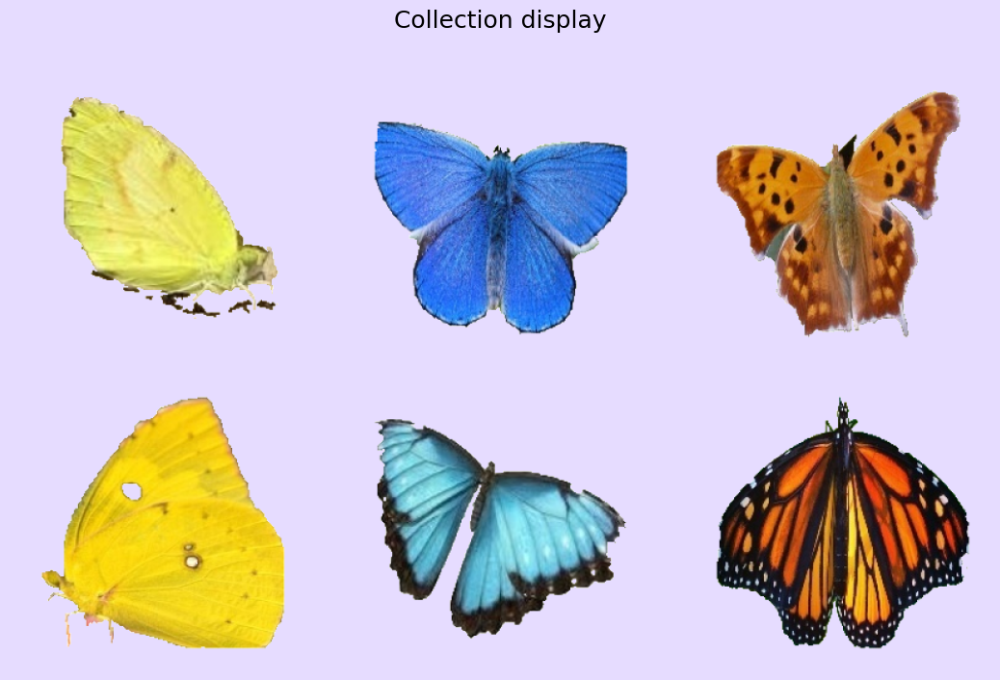

In [19]:
display_butterfly_subset(segmented_color_dict, n=2, dpi=100)

## Part 4: Odd one out:

Your extensive experience of looking at butterflies is quite useful!
You noticed that in each of the 4 images in every class, one of the butterflies is of a different species than the others! Can you find a way to differentiate it from the other 3 automatically? [5]

1. Average color and histogram differences

I tried histgram distances, average RGB, HSV colors, but it is still bad. Perhaps because the black rim or lack of black rim is more of a luminance difference, instead of a color difference. 

2. Filtering by brightness
Just filtering by brightness work! Because the odd one either has a odd black rim, or odd without black ri

In [20]:

# i want to try extracting the brightness
def extract_avg_brightness(img_rgb):
    """
    Convert image to HSV and return average V (brightness) value.
    """
    img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    avg_v = img_hsv[..., 2].mean()
    return avg_v

#find the odd one out by distance
def find_odd_one_out_by_brightness(images):
    """
    Find the odd one out using average brightness (V channel).
    Returns index of the odd image.
    """
    brightness = np.array([extract_avg_brightness(img) for img in images])

    dist_matrix = squareform(pdist(brightness[:, np.newaxis], metric='euclidean'))

    total_dists = dist_matrix.sum(axis=1)

    odd_index = int(np.argmax(total_dists))
    return odd_index

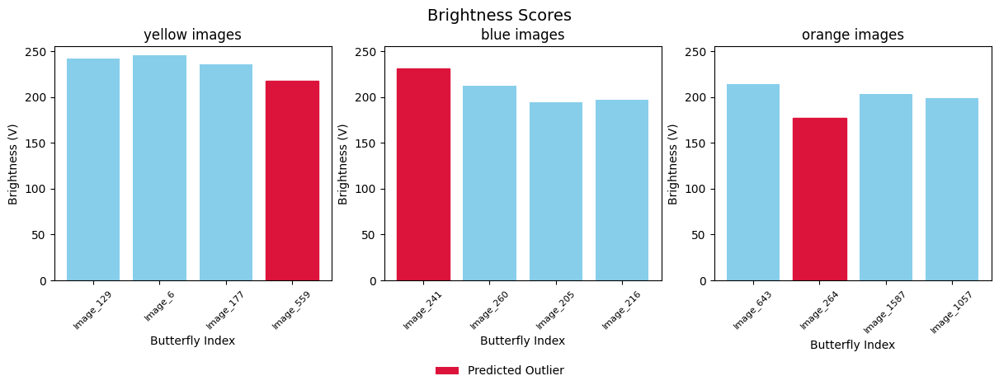

In [21]:


#collecting brightness data from each group
brightness_data = {}

for color, entries in segmented_color_dict.items():
    names = [entry['name'] for entry in entries]
    images = [entry['image'] for entry in entries]
    
    brightness = [extract_avg_brightness(img) for img in images]
    odd_idx = find_odd_one_out_by_brightness(images)
    
    brightness_data[color] = {
        'brightness': brightness,
        'odd_idx': odd_idx,
        'names': names
    }

#plotting
fig, axs = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

for i, color in enumerate(["yellow", "blue", "orange"]):
    data = brightness_data[color]
    bvals = data['brightness']
    odd = data['odd_idx']
    names = data['names']
    
    bars = axs[i].bar(range(len(bvals)), bvals, color='skyblue')
    bars[odd].set_color('crimson')  # Highlight the odd one
    
    axs[i].set_title(f"{color} images", fontsize=12)
    axs[i].set_xlabel("Butterfly Index")
    axs[i].set_ylabel("Brightness (V)")
    axs[i].set_xticks(range(len(bvals)))
    axs[i].set_xticklabels([name.split('.')[0] for name in names], rotation=45, fontsize=8)
    axs[i].set_ylim(0, 255)

# === Add legend for predicted outlier ===
legend_elements = [
    mpatches.Patch(facecolor='crimson', label='Predicted Outlier')
]
fig.legend(handles=legend_elements, loc='lower center', ncol=2, frameon=False, bbox_to_anchor=(0.5, -0.1))

# === Title ===
fig.suptitle("Brightness Scores", fontsize=14, y=1.05)

plt.show()


Because this didnt work very well, I will try a different technique.

In [22]:

# computing edges darkness/brightness
def simple_edge_blackness(image, black_threshold=80):
    """
    Simple method: check for dark pixels near detected edges.
    """
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    edges = cv2.Canny(gray, 30, 100)
    
    kernel = np.ones((3, 3), np.uint8)
    edge_dilated = cv2.dilate(edges, kernel, iterations=2)
    
    edge_pixels = gray[edge_dilated > 0]
    if len(edge_pixels) == 0:
        return 0.0
    
    dark_pixels = np.sum(edge_pixels < black_threshold)
    return dark_pixels / len(edge_pixels)

#finding the odd butterfly
def find_odd_butterflies(segmented_color_dict):
    """
    Find the odd butterfly in each color group.
    """
    odd_ones = {}
    
    for color, entries in segmented_color_dict.items():
        names = [entry['name'] for entry in entries]
        images = [entry['image'] for entry in entries]
        
        rim_scores = [simple_edge_blackness(img) for img in images]

        if not all(score == rim_scores[0] for score in rim_scores):
            mean_score = np.mean(rim_scores)
            differences = [abs(score - mean_score) for score in rim_scores]
            odd_index = np.argmax(differences)
        else:
            odd_index = 0 
        
        odd_ones[color] = names[odd_index]
    
        print(f"\nColor: {color}")
        for name, score in zip(names, rim_scores):
            marker = " <-- ODD" if names.index(name) == odd_index else ""
            print(f"{name}: score = {score:.4f}{marker}")
    
    return odd_ones

# Usage:
odd = find_odd_butterflies(segmented_color_dict)


Color: orange
Image_643.jpg: score = 0.3154 <-- ODD
Image_264.jpg: score = 0.6674
Image_1587.jpg: score = 0.5820
Image_1057.jpg: score = 0.5163

Color: blue
Image_241.jpg: score = 0.0572 <-- ODD
Image_260.jpg: score = 0.2488
Image_205.jpg: score = 0.4619
Image_216.jpg: score = 0.3828

Color: yellow
Image_129.jpg: score = 0.0321
Image_6.jpg: score = 0.0015
Image_177.jpg: score = 0.0530
Image_559.jpg: score = 0.3176 <-- ODD


In [23]:
# plotting
def plot_odd_butterflies(segmented_color_dict, odd_dict):
    """
    Plot all odd butterfly images in a horizontal row with titles.
    """
    num = len(odd_dict)
    fig, axes = plt.subplots(1, num, figsize=(4 * num, 4))

    if num == 1:
        axes = [axes]

    for i, (color, image_name) in enumerate(odd_dict.items()):
        for entry in segmented_color_dict[color]:
            if entry["name"] == image_name:
                image = entry["image"]
                break

        axes[i].imshow(image)
        axes[i].axis("off")
        axes[i].set_title(f"{color}: {image_name}", fontsize=10)

    plt.tight_layout()
    plt.suptitle("Edge Color Thresholding: Outliers", fontsize=16)
    plt.subplots_adjust(top=0.85)
    plt.show()

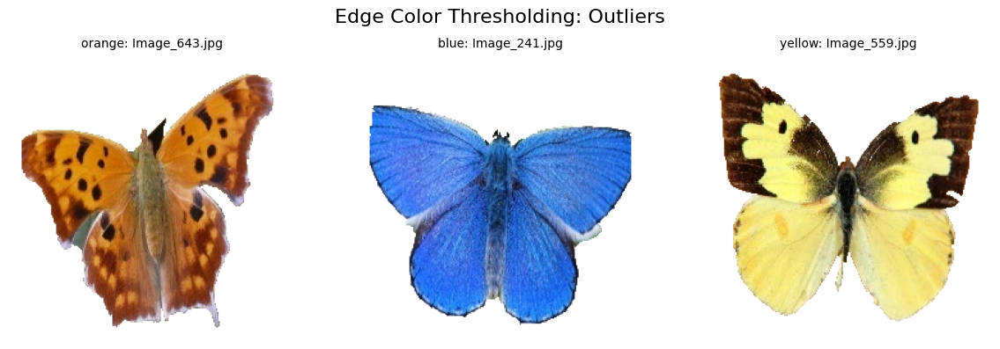

In [24]:
plot_odd_butterflies(segmented_color_dict, odd)